# Reanalisis of the clusters

In [1]:
cd /workspace

/workspace


In [2]:
import scanpy as sc
import pandas as pd
import seaborn as sns
import matplotlib
from matplotlib.pyplot import rc_context
import matplotlib.pyplot as plt
import os

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.figdir='./out/human_only_reanalisis'
sc.settings.set_figure_params(dpi=100, dpi_save=300,fontsize=12, frameon=False, facecolor='white', format='png', color_map='Reds')



In [3]:
print(sc.settings.figdir)

out/human_only_reanalisis


In [4]:
results_file = 'data/MSODB_human_reanalisis.h5ad'  # the file that will store the analysis results

In [5]:
adata = sc.read_h5ad('data/MSODB_human.h5ad')

In [6]:
adata

AnnData object with n_obs × n_vars = 1979 × 3000
    obs: 'n_genes', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'phase', 'leiden_0.4', 'leiden_0.47', 'leiden_0.5', 'leiden_0.6', 'leiden_0.8', 'leiden_1', 'clusters', 'cell_types'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'cell_types_colors', 'clusters_colors', 'hvg', 'leiden', 'leiden_0.47_colors', 'leiden_0.4_colors', 'leiden_0.5_colors', 'leiden_0.6_colors', 'leiden_0.8_colors', 'leiden_1_colors', 'neighbors', 'pca', 'phase_colors', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [7]:
adata.obs['cell_types']

AAACCCAAGGAAACGA-1           Early Chondrocytes
AAACCCAAGGGTAATT-1                   Osteo-Like
AAACCCAGTTGGACCC-1                      Stromal
AAACCCATCACCCTCA-1                      Cycling
AAACCCATCCGTCACT-1    Hypertrophic Chondrocites
                                ...            
TTTGGTTTCAATCTTC-1                   Osteo-Like
TTTGGTTTCATCCCGT-1                   Osteo-Like
TTTGTTGCAATTTCTC-1    Hypertrophic Chondrocites
TTTGTTGCATGGCTAT-1          Cell-cylce Arrested
TTTGTTGGTGTTGAGG-1                      Stromal
Name: cell_types, Length: 1979, dtype: category
Categories (6, object): ['Stromal', 'Early Chondrocytes', 'Cycling', 'Osteo-Like', 'Hypertrophic Chondrocites', 'Cell-cylce Arrested']

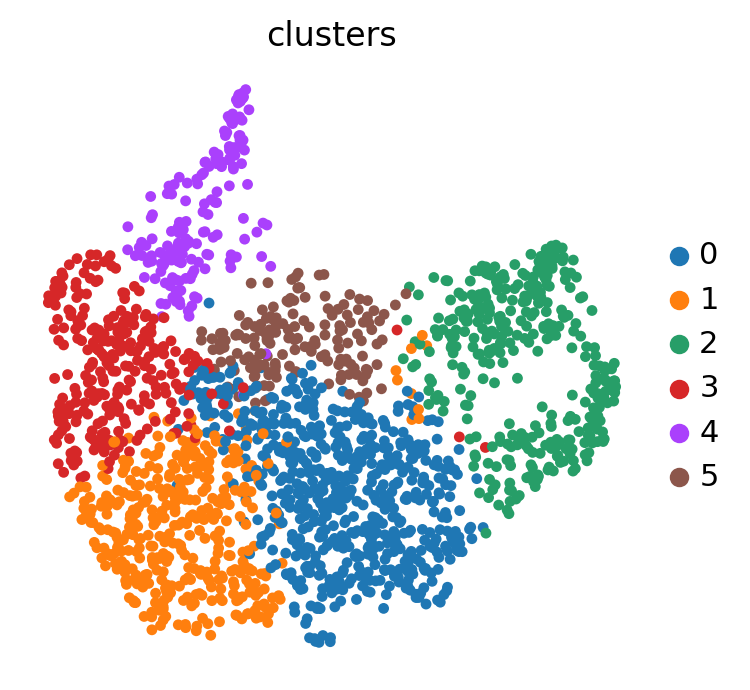

In [8]:
sc.pl.umap(adata, color = 'clusters')

In [9]:
cells = ['Stromal', 'Early Chondrocytes', 'Osteo-Like', 'Hypertrophic Chondrocites']
CC_arrest = ['Cell-cylce Arrested']

In [10]:
adata[adata.obs['cell_types']=='Cycling']


View of AnnData object with n_obs × n_vars = 354 × 3000
    obs: 'n_genes', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'phase', 'leiden_0.4', 'leiden_0.47', 'leiden_0.5', 'leiden_0.6', 'leiden_0.8', 'leiden_1', 'clusters', 'cell_types'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'cell_types_colors', 'clusters_colors', 'hvg', 'leiden', 'leiden_0.47_colors', 'leiden_0.4_colors', 'leiden_0.5_colors', 'leiden_0.6_colors', 'leiden_0.8_colors', 'leiden_1_colors', 'neighbors', 'pca', 'phase_colors', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [11]:
adata[adata.obs['cell_types'].isin(CC_arrest)]

View of AnnData object with n_obs × n_vars = 158 × 3000
    obs: 'n_genes', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'phase', 'leiden_0.4', 'leiden_0.47', 'leiden_0.5', 'leiden_0.6', 'leiden_0.8', 'leiden_1', 'clusters', 'cell_types'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'cell_types_colors', 'clusters_colors', 'hvg', 'leiden', 'leiden_0.47_colors', 'leiden_0.4_colors', 'leiden_0.5_colors', 'leiden_0.6_colors', 'leiden_0.8_colors', 'leiden_1_colors', 'neighbors', 'pca', 'phase_colors', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [12]:
adata_2 = adata[adata.obs['cell_types'].isin(cells)]
adata_2

View of AnnData object with n_obs × n_vars = 1467 × 3000
    obs: 'n_genes', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'phase', 'leiden_0.4', 'leiden_0.47', 'leiden_0.5', 'leiden_0.6', 'leiden_0.8', 'leiden_1', 'clusters', 'cell_types'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'cell_types_colors', 'clusters_colors', 'hvg', 'leiden', 'leiden_0.47_colors', 'leiden_0.4_colors', 'leiden_0.5_colors', 'leiden_0.6_colors', 'leiden_0.8_colors', 'leiden_1_colors', 'neighbors', 'pca', 'phase_colors', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [13]:
obs_keep = ['n_genes', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'phase','clusters', 'cell_types']
var_keep = ['gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts']

In [14]:
adata.obs

,n_genes,n_counts,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,S_score,G2M_score,phase,leiden_0.4,leiden_0.47,leiden_0.5,leiden_0.6,leiden_0.8,leiden_1,clusters,cell_types
AAACCCAAGGAAACGA-1,6071,39423.0,6069,39420.0,2887.0,7.323693,0.057381,-0.167171,S,1,Early Chondrocytes,1,2,1,0,1,Early Chondrocytes
AAACCCAAGGGTAATT-1,3697,12681.0,3691,12675.0,1111.0,8.765286,-0.137890,-0.150207,G1,3,Osteo-Like,2,3,3,2,3,Osteo-Like
AAACCCAGTTGGACCC-1,5143,27074.0,5136,27067.0,966.0,3.568922,-0.056802,-0.159930,G1,0,Stromal,0,1,0,1,0,Stromal
AAACCCATCACCCTCA-1,6240,37492.0,6239,37491.0,1034.0,2.757995,0.289764,0.503658,G2M,2,Cycling,3,4,5,4,2,Cycling
AAACCCATCCGTCACT-1,5131,16172.0,5123,16164.0,1.0,0.006187,0.005684,-0.190025,S,4,Hypertrophic Chondrocites,4,5,6,7,4,Hypertrophic Chondrocites
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTTCAATCTTC-1,5204,26662.0,5203,26661.0,882.0,3.308203,-0.230534,-0.200084,G1,3,Osteo-Like,2,3,3,2,3,Osteo-Like
TTTGGTTTCATCCCGT-1,4704,18147.0,4699,18142.0,742.0,4.089957,-0.063780,-0.255510,G1,3,Osteo-Like,2,3,3,2,3,Osteo-Like
TTTGTTGCAATTTCTC-1,6417,32946.0,6413,32941.0,1285.0,3.900914,0.203069,-0.123252,S,4,Hypertrophic Chondrocites,4,5,6,7,4,Hypertrophic Chondrocites
TTTGTTGCATGGCTAT-1,5252,19870.0,5247,19865.0,975.0,4.908130,0.367273,-0.131946,S,0,Cell-cylce Arrested,5,1,4,6,5,Cell-cylce Arrested


In [15]:
adata.obs.columns

Index(['n_genes', 'n_counts', 'n_genes_by_counts', 'total_counts',
       'total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'phase',
       'leiden_0.4', 'leiden_0.47', 'leiden_0.5', 'leiden_0.6', 'leiden_0.8',
       'leiden_1', 'clusters', 'cell_types'],
      dtype='object')

In [16]:
adata_2.obs.drop(adata_2.obs.columns.difference(obs_keep),1,  inplace=True)
adata_2.var.drop(adata_2.var.columns.difference(var_keep),1,inplace=True)
del(adata_2.uns, adata_2.obsm, adata_2.varm, adata_2.obsp, adata)
adata_2

/usr/local/lib/python3.8/dist-packages/anndata/_core/views.py:112: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  df.drop(*args, inplace=True, **kw)
<ipython-input-16-eea0c6abcb7c>:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  adata_2.var.drop(adata_2.var.columns.difference(var_keep),1,inplace=True)


AnnData object with n_obs × n_vars = 1467 × 3000
    obs: 'n_genes', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'phase', 'clusters', 'cell_types'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

computing PCA
    with n_comps=70
    finished (0:00:00)


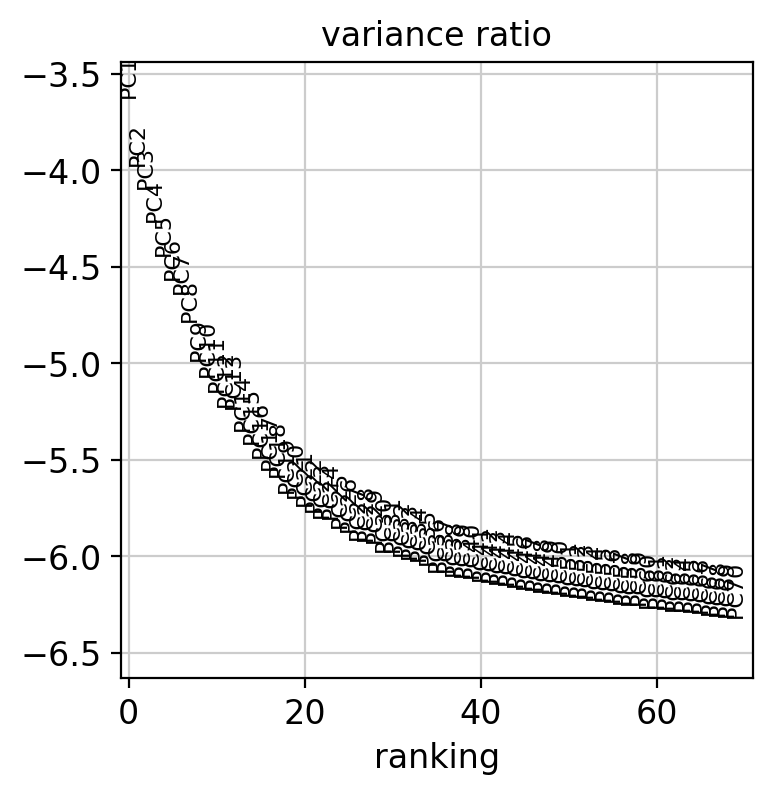

In [17]:
sc.tl.pca(adata_2, svd_solver='arpack', n_comps = 70)
sc.pl.pca_variance_ratio(adata_2, log=True, n_pcs=70, save='_PCA_elbow_MSODB')

In [18]:
sc.pp.neighbors(adata_2, n_neighbors=20, n_pcs=30)
sc.tl.umap(adata_2,min_dist= 0.25)

computing neighbors
    using 'X_pca' with n_pcs = 30


/usr/local/lib/python3.8/dist-packages/numba/core/cpu.py:97: UserWarning: Numba extension module 'sparse._numba_extension' failed to load due to 'ContextualVersionConflict((numpy 1.22.0 (/usr/local/lib/python3.8/dist-packages), Requirement.parse('numpy<1.22,>=1.18'), {'numba'}))'.
  numba.core.entrypoints.init_all()


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:07)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)


In [19]:
sc.tl.leiden(adata_2, resolution= 0.4, key_added='leiden_0.4')
sc.tl.leiden(adata_2, resolution= 0.47, key_added='leiden_0.47')
sc.tl.leiden(adata_2, resolution= 0.5, key_added='leiden_0.5')
sc.tl.leiden(adata_2, resolution= 0.6, key_added='leiden_0.6')
sc.tl.leiden(adata_2, resolution= 0.8, key_added='leiden_0.8')
adata_2

running Leiden clustering
    finished: found 4 clusters and added
    'leiden_0.4', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 4 clusters and added
    'leiden_0.47', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 5 clusters and added
    'leiden_0.5', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 6 clusters and added
    'leiden_0.6', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden_0.8', the cluster labels (adata.obs, categorical) (0:00:00)


AnnData object with n_obs × n_vars = 1467 × 3000
    obs: 'n_genes', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'phase', 'clusters', 'cell_types', 'leiden_0.4', 'leiden_0.47', 'leiden_0.5', 'leiden_0.6', 'leiden_0.8'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'pca', 'neighbors', 'umap', 'leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

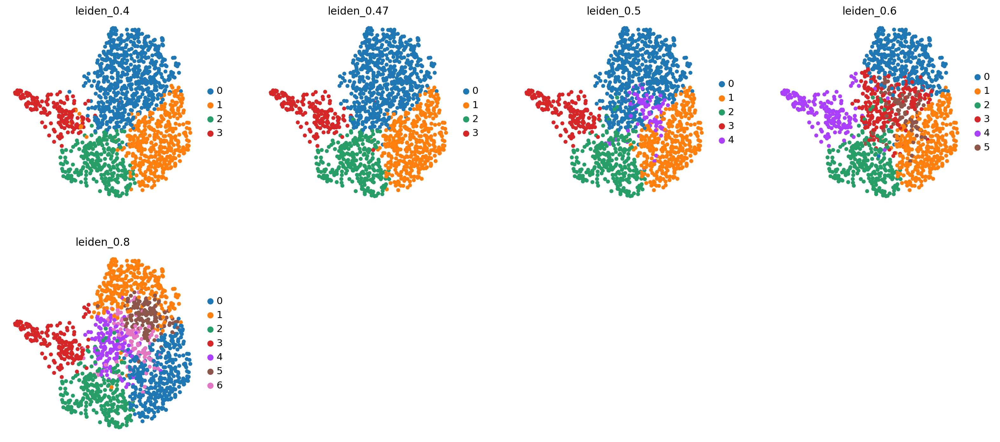

In [20]:
sc.pl.umap(adata_2, color= ['leiden_0.4', 'leiden_0.47','leiden_0.5','leiden_0.6','leiden_0.8'], save='UMAPS_leiden')

In [21]:
sc.tl.rank_genes_groups(adata_2,'leiden_0.47', method='wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


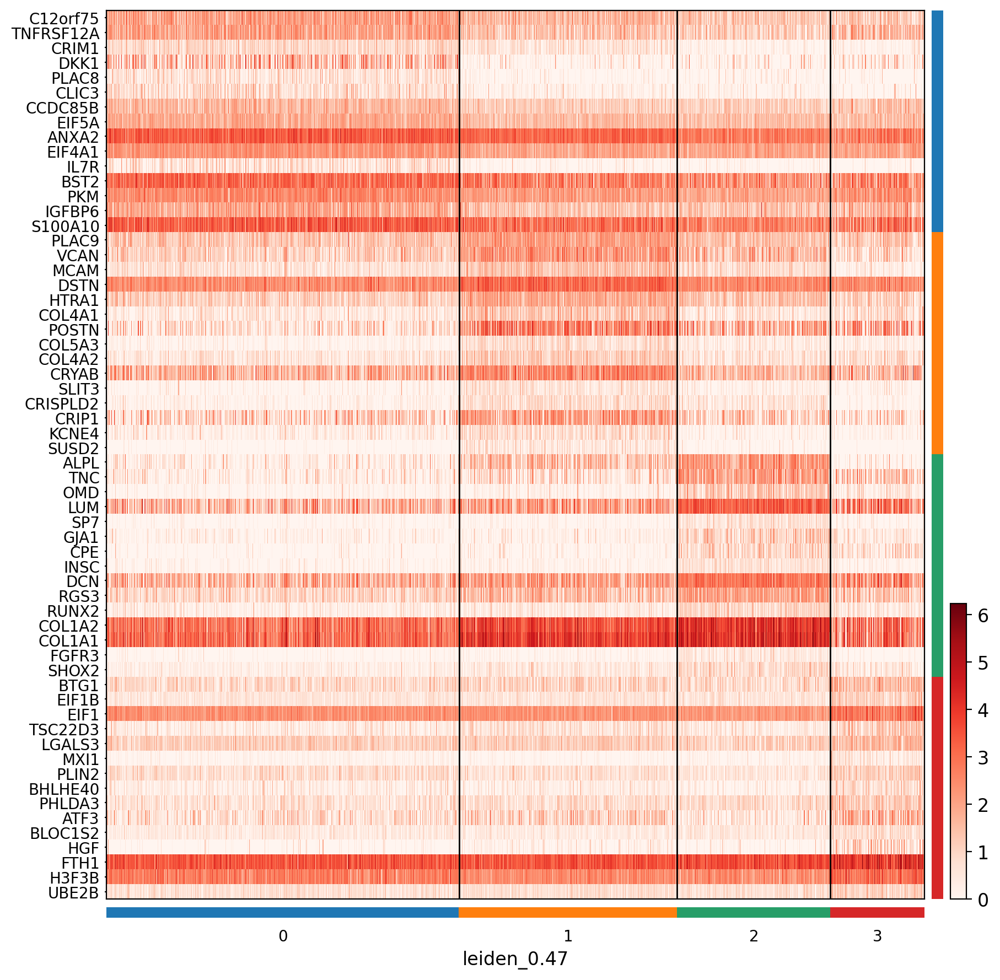

In [22]:
sc.pl.rank_genes_groups_heatmap(adata_2, n_genes=15,dendrogram=False,show_gene_labels=True, save='rankGenes_Heatmap_MSODB', swap_axes=True)

In [23]:
markerdict={
'Chondro-like' : ['ACAN', 'SOX9', 'COL10A1', 'VEGFA'],
'Stromal' : ['CXCL12','DKK1','VEGFC','SERPINE1','KITLG','ANGPT1','CSF1','IL7','IL7R','VCAM1','IGF1','BMP2','BMP4','JAG1','WNT5A',],
'Stromal_2' : ['MCAM','THY1','PDGFRA','PDGFRB','GREM1'],
'ECM-proteins' : ['COL1A1', 'COL1A2','ECM2'],
'ECM-Glicoproteins' : ['LAMA4', 'LAMA2', 'TNC', 'FN1', 'COL4A1', 'COL4A2'],
'Adipo' : ['PPARG','ADIPOR1','ADIPOR2','PLIN1','PLIN2','LEPR'],
'Osteo':  ['RUNX2','SP7','SPP1','IBSP','ALPL','BGLAP','COL1A1','FN1','TNC','SOST'],
'Cancer' : ['EMP1','NID1','NID2','SNAI2','IRF7']
}

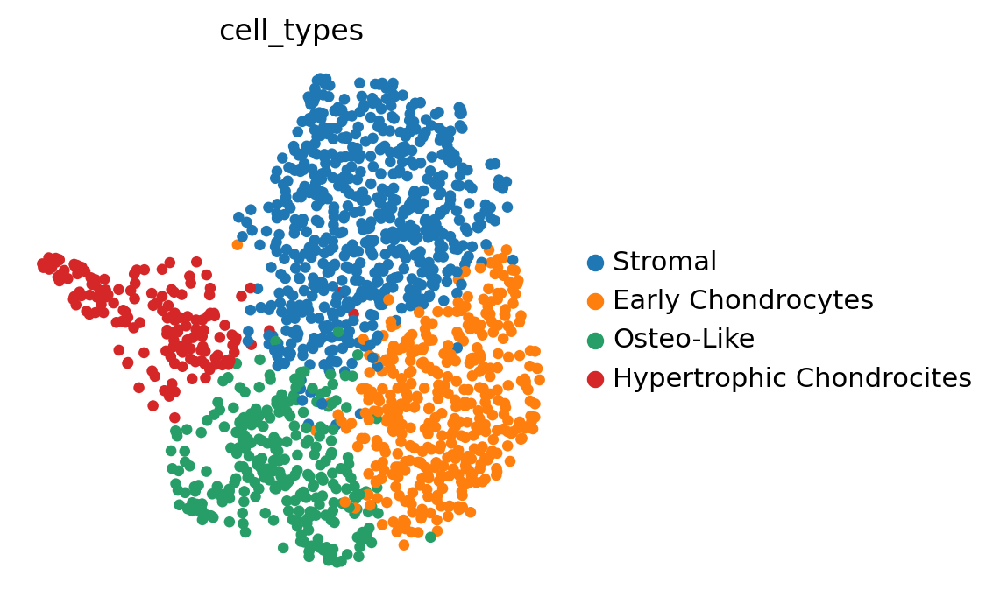

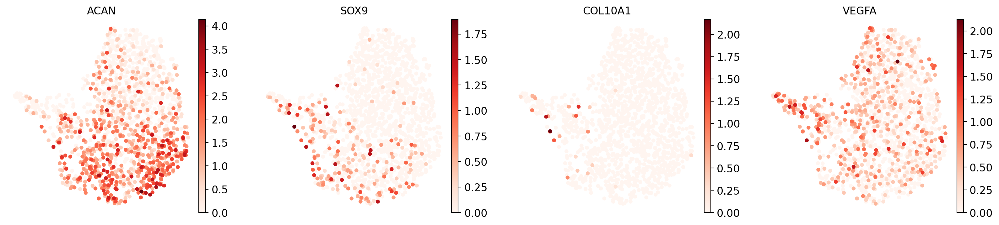

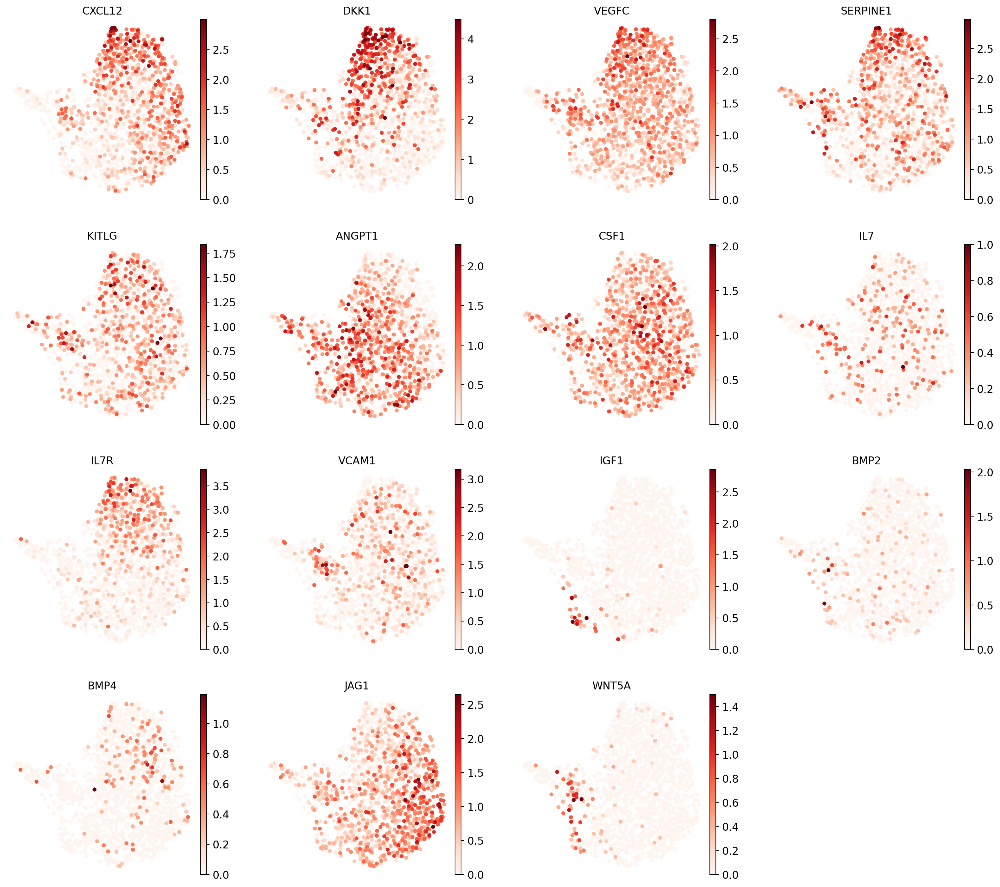

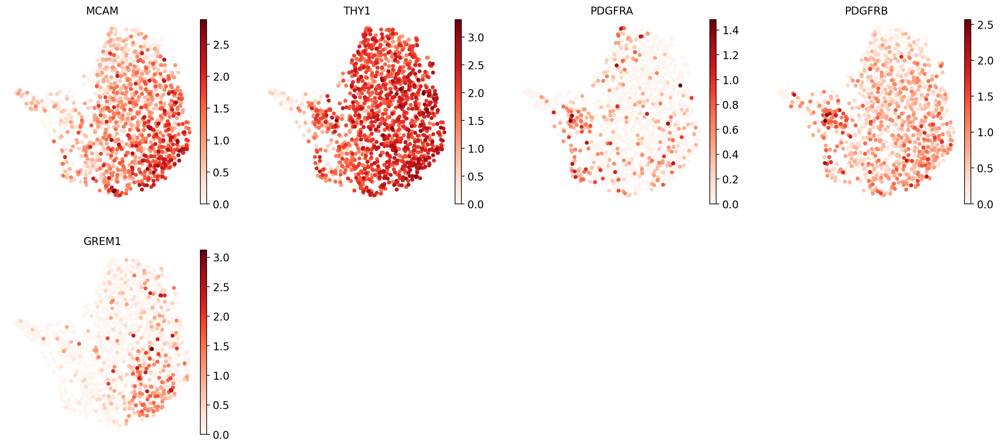

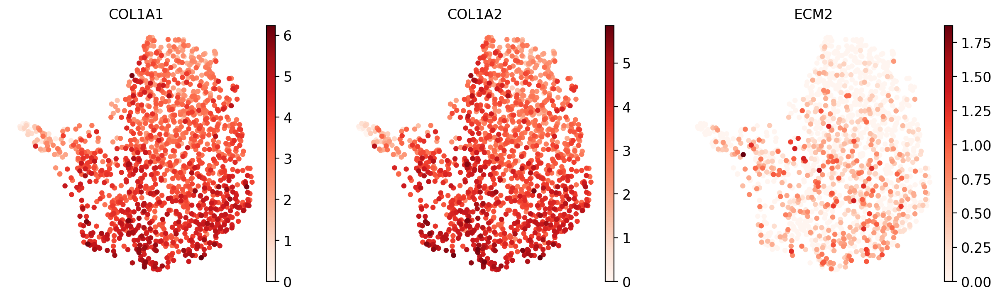

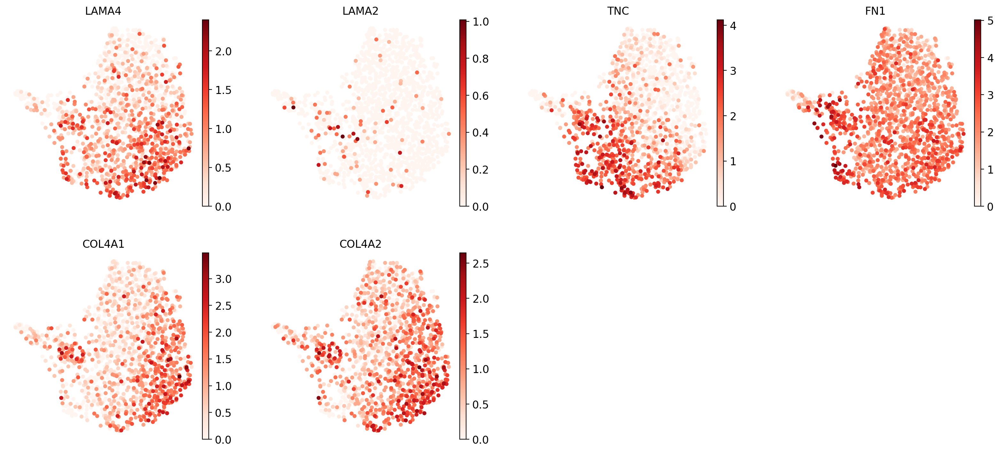

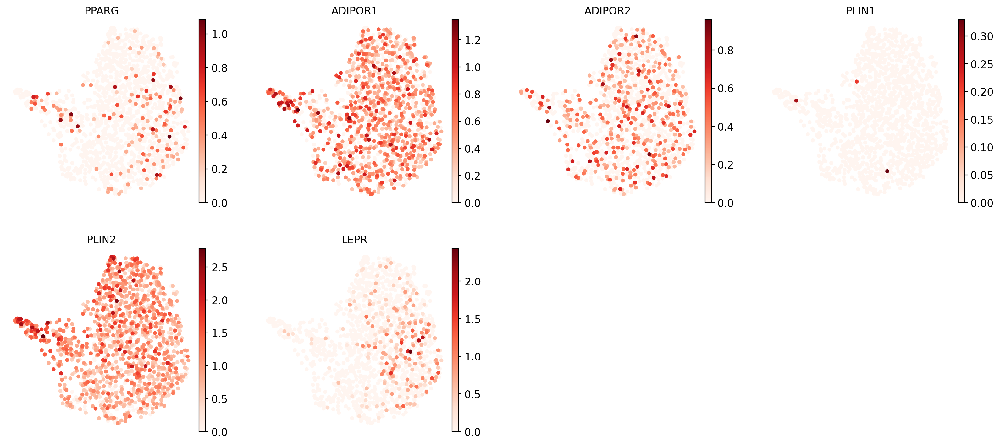

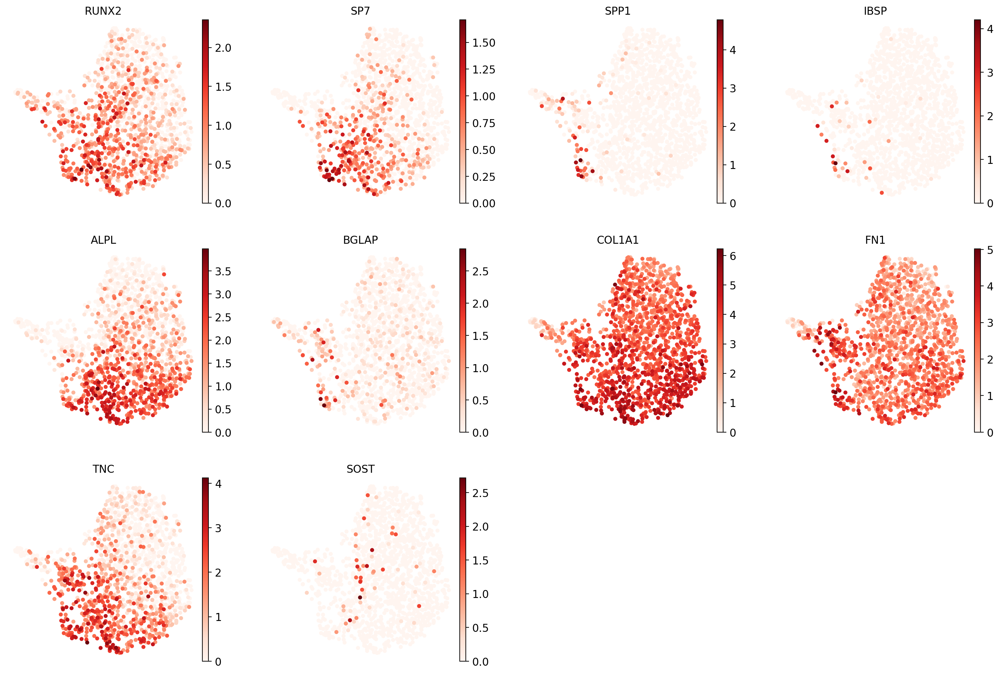

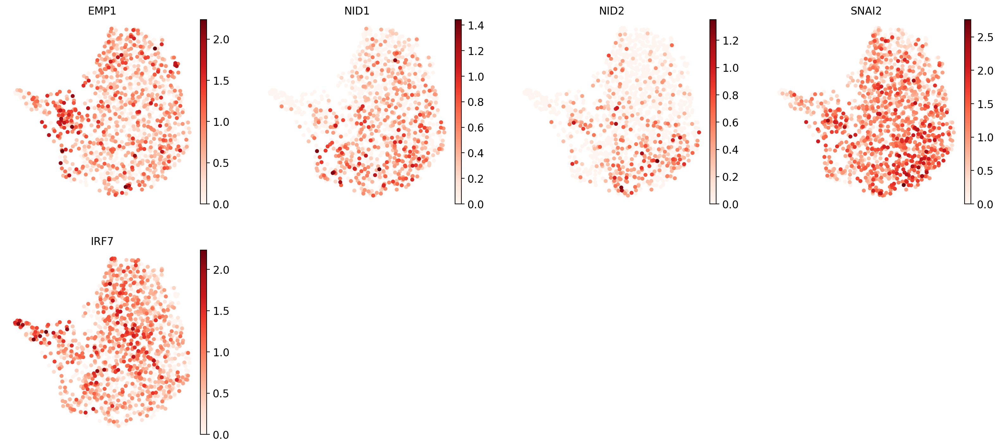

In [24]:
sc.pl.umap(adata_2, color='cell_types')
for key in markerdict:
    strsave='_'+key+'_MSODB_Final'
    sc.pl.umap(adata_2, color = markerdict[key],save = strsave)

In [25]:
adata_2

AnnData object with n_obs × n_vars = 1467 × 3000
    obs: 'n_genes', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'phase', 'clusters', 'cell_types', 'leiden_0.4', 'leiden_0.47', 'leiden_0.5', 'leiden_0.6', 'leiden_0.8'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'pca', 'neighbors', 'umap', 'leiden', 'leiden_0.4_colors', 'leiden_0.47_colors', 'leiden_0.5_colors', 'leiden_0.6_colors', 'leiden_0.8_colors', 'rank_genes_groups', 'cell_types_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [26]:
adata_2.write(results_file)

In [22]:
markerdict_2={
'Pro_angiogenic_stromal' : ['DKK1','TNFRSF12A', 'CRIM1', 'CLIC3', 'VEGFC',  'VEGFA','IL7R'],
'Skeletal_progenitors' : ['MCAM','GREM1','GREM1','SNAI2',  'LEPR', 'ACAN'],
'Osteo':  ['RUNX2','ALPL','COL1A1', 'COL1A2', 'TNC','SP7','IBSP','SPP1', 'BGLAP'],
'Adipo':['BTG1','MXI1','TSC22D3','PLIN2', 'PPARG']
}

In [23]:
new_cluster_names = ['1','2','3','4']

adata_2.obs['clusters'] = adata_2.obs['leiden_0.47']
adata_2.rename_categories('leiden_0.47', new_cluster_names)
adata_2.obs['clusters_2']=adata_2.obs['leiden_0.47']

/usr/local/lib/python3.8/dist-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.rename_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


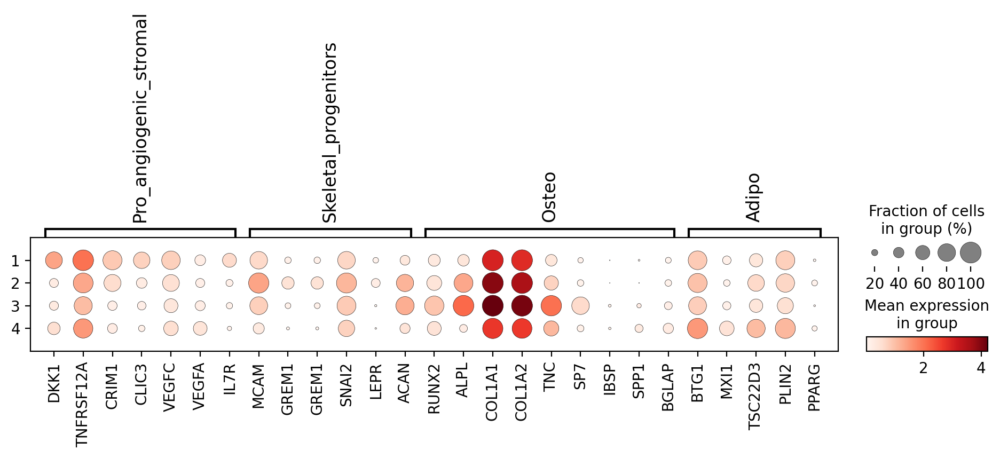

In [24]:
sc.pl.dotplot(adata_2, markerdict_2, 'clusters_2', dendrogram=False, save = 'MarkerGenes_Celltypes_dot')